### Some comments have been made before major changes and may not reflect reality

In [40]:
pip install pandas Pillow numpy scikit-learn seaborn matplotlib scikit-image openpyxl

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.1.1
[notice] To update, run: C:\Users\jassz\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [84]:
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.manifold import TSNE, Isomap, LocallyLinearEmbedding
import seaborn as sns
from skimage.measure import label, regionprops
from skimage import io
from skimage.color import rgb2gray
from skimage.feature import local_binary_pattern
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
import shutil
import random


### Loading data

In [113]:
classification_df = pd.read_csv(r'pets/annotations/list.txt', sep=' ')
print(classification_df)

                  CLASS-ID  SPECIES  BREED  ID
0           Abyssinian_100        1      1   1
1           Abyssinian_101        1      1   1
2           Abyssinian_102        1      1   1
3           Abyssinian_103        1      1   1
4           Abyssinian_104        1      1   1
...                    ...      ...    ...  ..
7330  yorkshire_terrier_96       37      2  25
7331  yorkshire_terrier_97       37      2  25
7332  yorkshire_terrier_98       37      2  25
7333  yorkshire_terrier_99       37      2  25
7334   yorkshire_terrier_9       37      2  25

[7335 rows x 4 columns]


In [47]:
def convert_trimap_to_mask(trimap_name):
    
    trimap_path = fr'pets/annotations/trimaps/{trimap_name}.PNG'
    # Load the trimap
    trimap = Image.open(f'{trimap_path}').convert('L')
    trimap_np = np.array(trimap)
    
    # Convert trimap to mask
    mask_np = np.where((trimap_np == 1) | (trimap_np == 3), 255, 0).astype(np.uint8)
    
    # Create an image from the mask
    mask = Image.fromarray(mask_np)
    
    mask_path = rf'pets/annotations/masks/{trimap_name}.tif'
    # Save the mask as a .tif file
    mask.save(mask_path, format='TIFF')

In [48]:
# Converting trimaps to masks
for pet in classification_df['CLASS-ID']:
    convert_trimap_to_mask(pet)

### Leave some data for testing at the end [DO NOT RUN]

In [81]:
for i in range(1, 51):  # Corrected range to start from 1 to 50
    image_path = rf'pets\images\Abyssinian_{i}.JPG'
    mask_path = rf'pets\annotations\masks\Abyssinian_{i}.tif'
    
    dest_image_path = rf'pets\test\{i}.JPG'
    dest_mask_path = rf'pets\test\masks\{i}.tif'
    
    # Move the image and mask to the destination paths
    try:
        shutil.move(image_path, dest_image_path)
        shutil.move(mask_path, dest_mask_path)
    except:
        pass

for i in range(51, 100):
    image_path = rf'pets\images\beagle_{i}.JPG'
    mask_path = rf'pets\annotations\masks\beagle_{i}.tif'
    
    dest_image_path = rf'pets\test\{i}.JPG'
    dest_mask_path = rf'pets\test\masks\{i}.tif'
    
    # Move the image and mask to the destination paths
    try:
        shutil.move(image_path, dest_image_path)
        shutil.move(mask_path, dest_mask_path)
    except:
        pass

In [82]:
# Directories
images_dir = r'pets\images'
masks_dir = r'pets\annotations\masks'
dest_images_dir = r'pets\selected\images'
dest_masks_dir = r'pets\selected\masks'

# Ensure destination directories exist
os.makedirs(dest_images_dir, exist_ok=True)
os.makedirs(dest_masks_dir, exist_ok=True)

# List all image files
all_images = [f for f in os.listdir(images_dir) if os.path.isfile(os.path.join(images_dir, f))]

# Randomly select 20 images
selected_images = random.sample(all_images, 20)

# Move selected images and their masks
for image_name in selected_images:
    # Construct source paths
    image_path = os.path.join(images_dir, image_name)
    mask_name = os.path.splitext(image_name)[0] + '.tif'  # Assuming mask has same name with .tif extension
    mask_path = os.path.join(masks_dir, mask_name)
    
    # Construct destination paths
    dest_image_path = os.path.join(dest_images_dir, image_name)
    dest_mask_path = os.path.join(dest_masks_dir, mask_name)
    
    # Move files
    shutil.move(image_path, dest_image_path)
    shutil.move(mask_path, dest_mask_path)

In [83]:
# Starting number for renaming
start_number = 100

# List and sort all image files in the selected images directory
selected_images = sorted([f for f in os.listdir(dest_images_dir) if os.path.isfile(os.path.join(dest_images_dir, f))])

# Rename images and their masks
for i, image_name in enumerate(selected_images, start=start_number):
    # Construct current paths
    current_image_path = os.path.join(dest_images_dir, image_name)
    mask_name = os.path.splitext(image_name)[0] + '.tif'  # Assuming mask has same name with .tif extension
    current_mask_path = os.path.join(dest_masks_dir, mask_name)
    
    # Construct new paths with numbers starting from 100
    new_image_name = f"{i}.jpg"  # Assuming the images are in jpg format
    new_mask_name = f"{i}.tif"
    new_image_path = os.path.join(dest_images_dir, new_image_name)
    new_mask_path = os.path.join(dest_masks_dir, new_mask_name)
    
    # Rename files
    os.rename(current_image_path, new_image_path)
    os.rename(current_mask_path, new_mask_path)

### Editing data to fit needs

In [114]:
classification_df['BREED'] = classification_df['BREED'].replace({1: 'Cat', 2: 'Dog'})
classification_df['SPECIES'] = classification_df['CLASS-ID'].str.extract(r'(^.+)_[0-9]+$')[0]
print(classification_df.head())

         CLASS-ID     SPECIES BREED  ID
0  Abyssinian_100  Abyssinian   Cat   1
1  Abyssinian_101  Abyssinian   Cat   1
2  Abyssinian_102  Abyssinian   Cat   1
3  Abyssinian_103  Abyssinian   Cat   1
4  Abyssinian_104  Abyssinian   Cat   1


### Filtering data

In [115]:
# Remove ID column
classification_df = classification_df.drop(columns=['ID'])

# Get all Abyssinian cats and beagle dogs
filtered_df = classification_df[(classification_df['SPECIES'] == 'Abyssinian') | (classification_df['SPECIES'] == 'beagle')]

# Get three instances of each remaining species
other_species = classification_df[(classification_df['SPECIES'] != 'Abyssinian') & (classification_df['SPECIES'] != 'beagle')]
three_species = other_species.groupby('SPECIES').head(3)

# Combine the dataframes
classification_df = pd.concat([filtered_df, three_species])

# Mark other species as 'OTHER'
classification_df.loc[~((classification_df['SPECIES'] == 'Abyssinian') | (classification_df['SPECIES'] == 'beagle')), 'SPECIES'] = 'OTHER'
print(classification_df)

                   CLASS-ID     SPECIES BREED
0            Abyssinian_100  Abyssinian   Cat
1            Abyssinian_101  Abyssinian   Cat
2            Abyssinian_102  Abyssinian   Cat
3            Abyssinian_103  Abyssinian   Cat
4            Abyssinian_104  Abyssinian   Cat
...                     ...         ...   ...
1746    wheaten_terrier_101       OTHER   Dog
1747    wheaten_terrier_102       OTHER   Dog
1795  yorkshire_terrier_100       OTHER   Dog
1796  yorkshire_terrier_101       OTHER   Dog
1797  yorkshire_terrier_102       OTHER   Dog

[503 rows x 3 columns]


### Choose what to recognize
Either SPECIES or BREED

In [116]:
RECOGNIZE = 'SPECIES'

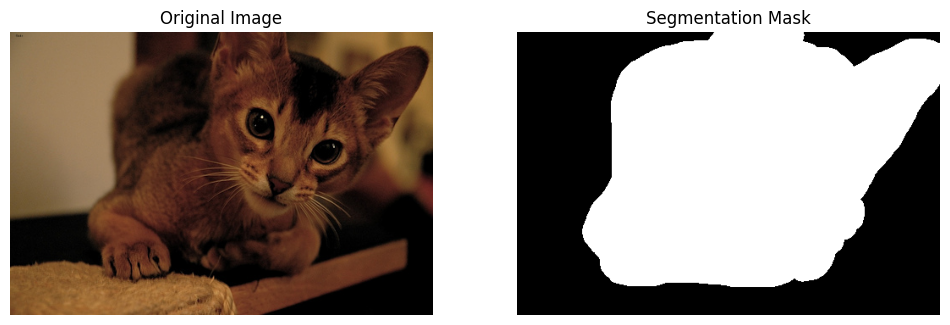

In [117]:
#example picture
pet = 'Abyssinian_52'
image = Image.open(rf'pets/images/{pet}.JPG').convert('RGB')

mask = Image.open(rf'pets/annotations/masks/{pet}.tif').convert('L')

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(mask, cmap='gray')
plt.title('Segmentation Mask')
plt.axis('off')

plt.show()

## III.1 Feature Extraction

In [118]:
#methods for extracting needed values

def pixel_ratio(mask):
    if isinstance(mask, Image.Image):
        mask = np.array(mask)
    total_pixels = mask.size
    bug_pixels = np.sum(mask > 0)
    return bug_pixels / total_pixels


def color_statistics(image, mask):
    image_np = np.array(image)
    mask_np = np.array(mask)
    
    red_channel = image_np[:,:,0][mask_np == 255]
    green_channel = image_np[:,:,1][mask_np == 255]
    blue_channel = image_np[:,:,2][mask_np == 255]
    
    stats = {}
    for channel, color in zip([red_channel, green_channel, blue_channel], ['red', 'green', 'blue']):
        stats[f'{color}_min'] = np.min(channel)
        stats[f'{color}_max'] = np.max(channel)
        stats[f'{color}_mean'] = np.mean(channel)
        stats[f'{color}_median'] = np.median(channel)
        stats[f'{color}_std'] = np.std(channel)
    
    return stats


def aspect_ratio(mask):
    if isinstance(mask, Image.Image):
        mask = np.array(mask)
    
    coordinates = np.argwhere(mask > 0)
    if coordinates.size == 0:
        return 0  
    
    y_min, x_min = coordinates.min(axis=0)
    y_max, x_max = coordinates.max(axis=0)
    
    return (x_max - x_min) / (y_max - y_min) if (y_max - y_min) != 0 else 0  # Prevent division by zero


def compactness(mask):
    if isinstance(mask, Image.Image):
        mask = np.array(mask)

    area = np.sum(mask > 0)
    perimeter = np.sum(np.abs(np.diff(mask, axis=0)) > 0) + np.sum(np.abs(np.diff(mask, axis=1)) > 0)
    
    return 4 * np.pi * area / (perimeter ** 2) if perimeter > 0 else 0


def solidity(mask):
    if isinstance(mask, Image.Image):
        mask = np.array(mask)

    area = np.sum(mask > 0)

    #calculating the outbounding box
    rows = np.any(mask, axis=1)
    cols = np.any(mask, axis=0)
    ymin, ymax = np.where(rows)[0][[0, -1]]
    xmin, xmax = np.where(cols)[0][[0, -1]]
    bounding_box_area = (ymax - ymin + 1) * (xmax - xmin + 1)

    return area / bounding_box_area if bounding_box_area > 0 else 0


def eccentricity(mask):
    mask_np = np.array(mask)
    if np.max(mask_np) > 1:
        mask_np = mask_np > 0
        
    label_img = label(mask_np)
    props = regionprops(label_img)

    if len(props):
        return props[0].eccentricity
    else:
        return np.nan


In [119]:
#calculating values for example picture
print("Feature Calculations:")
print("------------------------------")
print(f"Pixel Ratio: {pixel_ratio(mask):.4f}")

color_statistics_result = color_statistics(image, mask)
print("Color Statistics:")
for color in ['red', 'green', 'blue']:
    print(f"  {color.capitalize()} Min: {color_statistics_result[f'{color}_min']}")
    print(f"  {color.capitalize()} Max: {color_statistics_result[f'{color}_max']}")
    print(f"  {color.capitalize()} Mean: {color_statistics_result[f'{color}_mean']:.2f}")
    print(f"  {color.capitalize()} Median: {color_statistics_result[f'{color}_median']}")
    print(f"  {color.capitalize()} Std: {color_statistics_result[f'{color}_std']:.2f}")

print(f"Aspect Ratio: {aspect_ratio(mask):.4f}")
print(f"Compactness: {compactness(mask):.4f}")
print(f"Solidity: {solidity(mask):.4f}")

# Extracting and printing shape features
print(f"Eccentricity: {eccentricity(mask):.4f}")


Feature Calculations:
------------------------------
Pixel Ratio: 0.5642
Color Statistics:
  Red Min: 0
  Red Max: 255
  Red Mean: 69.72
  Red Median: 71.0
  Red Std: 40.38
  Green Min: 0
  Green Max: 248
  Green Mean: 38.62
  Green Median: 34.0
  Green Std: 26.99
  Blue Min: 0
  Blue Max: 209
  Blue Mean: 24.61
  Blue Median: 24.0
  Blue Std: 15.67
Aspect Ratio: 1.4020
Compactness: 0.6120
Solidity: 0.7398
Eccentricity: 0.7139


### Calculating the data:

In [120]:
def calculate_add_df(df):
    image_folder = r"pets/images"
    mask_folder = r"pets/annotations/masks"
    
    pixel_ratios = []
    aspect_ratios = []
    compactness_scores = []
    solidities = []
    eccentricities = []
    color_stats = []

    for pet in df['CLASS-ID']:
        image_path = os.path.join(image_folder, f"{pet}.JPG")
        mask_path = os.path.join(mask_folder, f"{pet}.tif")

        if os.path.exists(image_path) and os.path.exists(mask_path):
            image = Image.open(image_path).convert('RGB')
            mask = Image.open(mask_path).convert('L')

            # Call the updated function names
            try:
                pixel_ratios.append(pixel_ratio(mask))
                aspect_ratios.append(aspect_ratio(mask))
                compactness_scores.append(compactness(mask))
                solidities.append(solidity(mask))
                color_stats.append(color_statistics(image, mask))
                eccentricities.append(eccentricity(mask))
            except:
                os.remove(image_path)
                os.remove(mask_path)
                print(f"Removed corrupted files for {pet}...")
        else:
            pixel_ratios.append(np.nan)
            aspect_ratios.append(np.nan)
            compactness_scores.append(np.nan)
            solidities.append(np.nan)
            eccentricities.append(np.nan)
            color_stats.append({key: np.nan for key in ['red_min', 'red_max', 'red_mean', 'red_median', 'red_std',
                                                       'green_min', 'green_max', 'green_mean', 'green_median', 'green_std',
                                                       'blue_min', 'blue_max', 'blue_mean', 'blue_median', 'blue_std']})

    df['Pixel Ratio'] = pixel_ratios
    df['Aspect Ratio'] = aspect_ratios
    df['Compactness'] = compactness_scores
    df['Solidity'] = solidities
    df['Eccentricity'] = eccentricities
    
    for key in color_stats[0]:
        df[key] = [cs[key] for cs in color_stats]

    return df

# Apply the function
classification_df = calculate_add_df(classification_df)
classification_df

,CLASS-ID,SPECIES,BREED,Pixel Ratio,Aspect Ratio,Compactness,Solidity,Eccentricity,red_min,red_max,...,green_min,green_max,green_mean,green_median,green_std,blue_min,blue_max,blue_mean,blue_median,blue_std
0,Abyssinian_100,Abyssinian,Cat,0.417020,0.697674,0.353054,0.633257,0.834737,0.0,255.0,...,0.0,255.0,109.635436,111.0,67.418850,0.0,255.0,84.650031,76.0,65.678920
1,Abyssinian_101,Abyssinian,Cat,0.292354,1.320755,0.453662,0.687986,0.716454,0.0,255.0,...,0.0,255.0,101.437029,95.0,53.490950,0.0,255.0,64.227184,56.0,46.413468
2,Abyssinian_102,Abyssinian,Cat,0.679462,1.092551,0.497785,0.733607,0.615846,0.0,255.0,...,0.0,255.0,134.684982,140.0,44.928459,0.0,255.0,85.709024,88.0,43.399485
3,Abyssinian_103,Abyssinian,Cat,0.279254,1.281787,0.264470,0.448767,0.865837,0.0,255.0,...,0.0,255.0,139.205983,145.0,61.208600,0.0,255.0,90.631925,89.0,53.540218
4,Abyssinian_104,Abyssinian,Cat,0.333251,2.122222,0.234544,0.466603,0.898146,1.0,255.0,...,0.0,247.0,94.691921,98.0,47.699213,0.0,203.0,55.840663,55.0,36.157556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1746,wheaten_terrier_101,OTHER,Dog,0.243778,0.541420,0.407836,0.652671,0.916908,0.0,255.0,...,0.0,255.0,152.403552,154.0,60.192746,0.0,255.0,155.272433,168.0,61.820362
1747,wheaten_terrier_102,OTHER,Dog,0.204330,0.800000,0.504008,0.674337,0.729787,0.0,249.0,...,4.0,248.0,137.504835,134.0,44.555301,4.0,252.0,119.552982,113.0,50.035386
1795,yorkshire_terrier_100,OTHER,Dog,0.542021,0.933155,1.005494,0.774316,0.642864,0.0,255.0,...,0.0,255.0,84.427476,61.0,77.198856,0.0,255.0,82.209468,56.0,78.837934
1796,yorkshire_terrier_101,OTHER,Dog,0.693749,1.114973,1.194104,0.829844,0.521811,0.0,255.0,...,0.0,255.0,132.951514,139.0,57.625394,0.0,255.0,100.505643,100.0,63.958231


checking for NaN values:

In [121]:
classification_df.isna().sum()

CLASS-ID         0
SPECIES          0
BREED            0
Pixel Ratio     92
Aspect Ratio    92
Compactness     92
Solidity        92
Eccentricity    92
red_min         92
red_max         92
red_mean        92
red_median      92
red_std         92
green_min       92
green_max       92
green_mean      92
green_median    92
green_std       92
blue_min        92
blue_max        92
blue_mean       92
blue_median     92
blue_std        92
dtype: int64

In [122]:
df = classification_df[classification_df["Pixel Ratio"].isna()]
df

,CLASS-ID,SPECIES,BREED,Pixel Ratio,Aspect Ratio,Compactness,Solidity,Eccentricity,red_min,red_max,...,green_min,green_max,green_mean,green_median,green_std,blue_min,blue_max,blue_mean,blue_median,blue_std
10,Abyssinian_10,Abyssinian,Cat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21,Abyssinian_11,Abyssinian,Cat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32,Abyssinian_12,Abyssinian,Cat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
43,Abyssinian_13,Abyssinian,Cat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1848,Abyssinian_14,Abyssinian,Cat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4165,beagle_95,beagle,Dog,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4166,beagle_96,beagle,Dog,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4167,beagle_97,beagle,Dog,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4168,beagle_98,beagle,Dog,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


The images that we moved earlier are now understandably missing let's delete those entries

In [123]:
classification_df = classification_df.dropna(subset=["Pixel Ratio"])

Now we are ready for analisys.

## III.2 Data visualization

### Repartitions between the different types of bugs

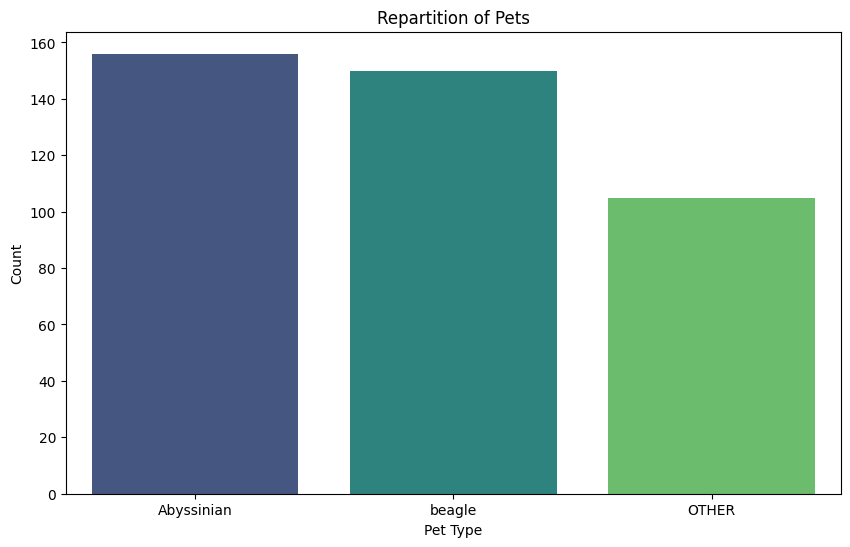

In [124]:
plt.figure(figsize=(10, 6))
sns.countplot(data=classification_df, x=RECOGNIZE, hue=RECOGNIZE, palette='viridis', legend=False)
plt.title('Repartition of Pets')
plt.xlabel('Pet Type')
plt.ylabel('Count')
plt.show()


### PCA

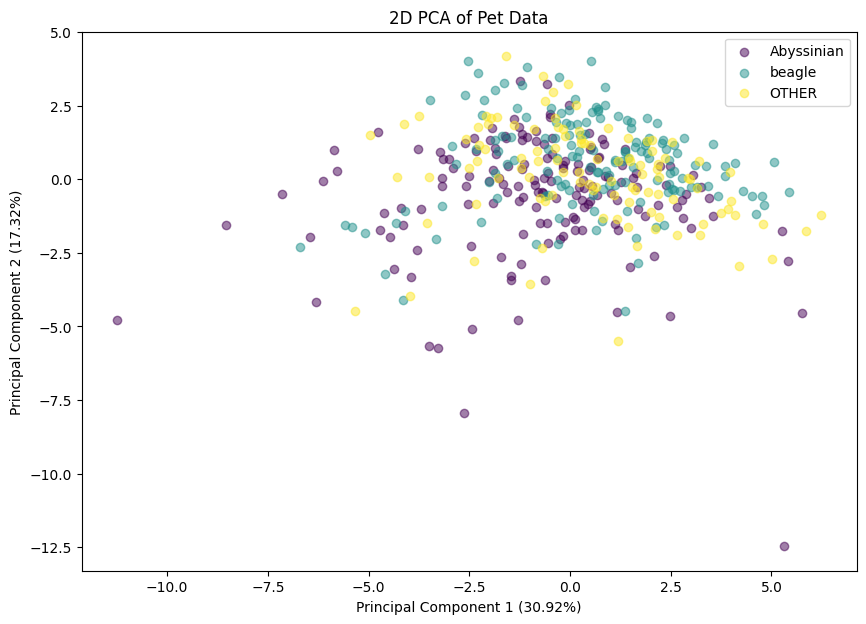

In [125]:
classification_df_copy = classification_df.copy()

numeric_cols = classification_df_copy.select_dtypes(include=[float, int]).columns

scaler = StandardScaler()
scaled_data = scaler.fit_transform(classification_df_copy[numeric_cols])

pca = PCA(n_components=2)
principal_components = pca.fit_transform(scaled_data)

pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

pca_df[RECOGNIZE] = classification_df_copy[RECOGNIZE].values

pc1 = round(pca.explained_variance_ratio_[0] * 100, 2)
pc2 = round(pca.explained_variance_ratio_[1] * 100, 2)

plt.figure(figsize=(10, 7))

unique_pet_types = pca_df[RECOGNIZE].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(unique_pet_types)))

for i, pet_type in enumerate(unique_pet_types):
    indices_to_keep = pca_df[RECOGNIZE] == pet_type
    plt.scatter(
        pca_df.loc[indices_to_keep, 'PC1'],
        pca_df.loc[indices_to_keep, 'PC2'],
        color=colors[i],
        alpha=0.5,
        label=pet_type
    )

plt.xlabel(f'Principal Component 1 ({pc1}%)')
plt.ylabel(f'Principal Component 2 ({pc2}%)')
plt.title('2D PCA of Pet Data')
plt.legend()
plt.show()

### TSNE

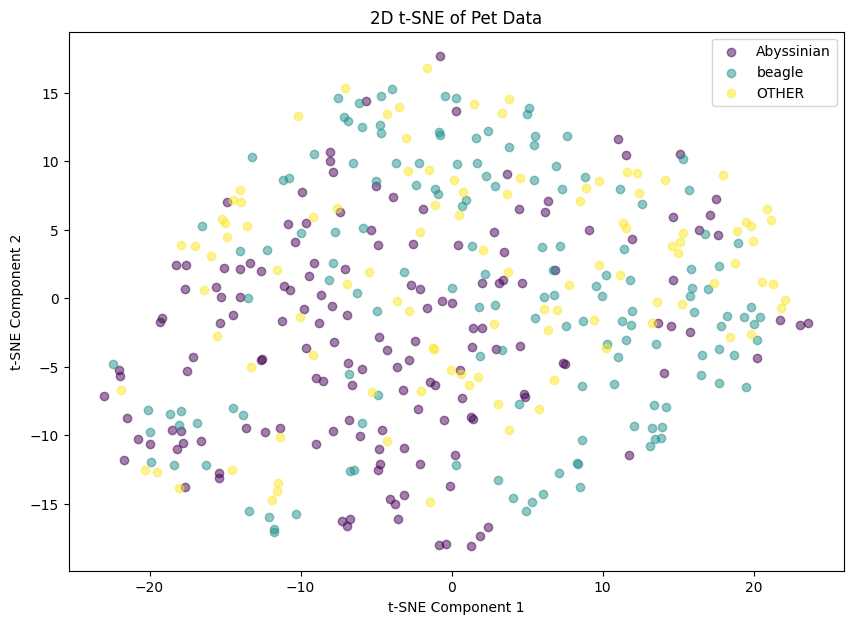

In [126]:
tsne = TSNE(n_components=2, random_state=0)
tsne_components = tsne.fit_transform(scaled_data)

tsne_df = pd.DataFrame(data=tsne_components, columns=['t-SNE1', 't-SNE2'])
tsne_df[RECOGNIZE] = classification_df[RECOGNIZE].values

plt.figure(figsize=(10, 7))
for i, pet_type in enumerate(unique_pet_types):
    indices_to_keep = tsne_df[RECOGNIZE] == pet_type
    plt.scatter(
        tsne_df.loc[indices_to_keep, 't-SNE1'],
        tsne_df.loc[indices_to_keep, 't-SNE2'],
        color=colors[i],
        alpha=0.5,
        label=pet_type
    )
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('2D t-SNE of Pet Data')
plt.legend()
plt.show()

### ISOMAP

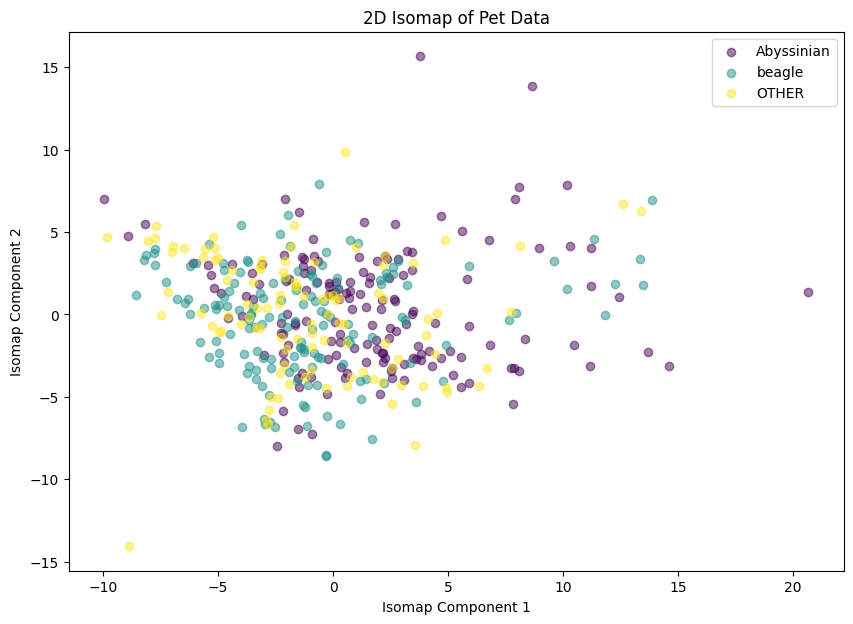

In [127]:
isomap = Isomap(n_components=2)
isomap_components = isomap.fit_transform(scaled_data)

isomap_df = pd.DataFrame(data=isomap_components, columns=['Isomap1', 'Isomap2'])
isomap_df[RECOGNIZE] = classification_df[RECOGNIZE].values

plt.figure(figsize=(10, 7))
for i, pet_type in enumerate(unique_pet_types):
    indices_to_keep = isomap_df[RECOGNIZE] == pet_type
    plt.scatter(
        isomap_df.loc[indices_to_keep, 'Isomap1'],
        isomap_df.loc[indices_to_keep, 'Isomap2'],
        color=colors[i],
        alpha=0.5,
        label=pet_type
    )
plt.xlabel('Isomap Component 1')
plt.ylabel('Isomap Component 2')
plt.title('2D Isomap of Pet Data')
plt.legend()
plt.show()

### LLE

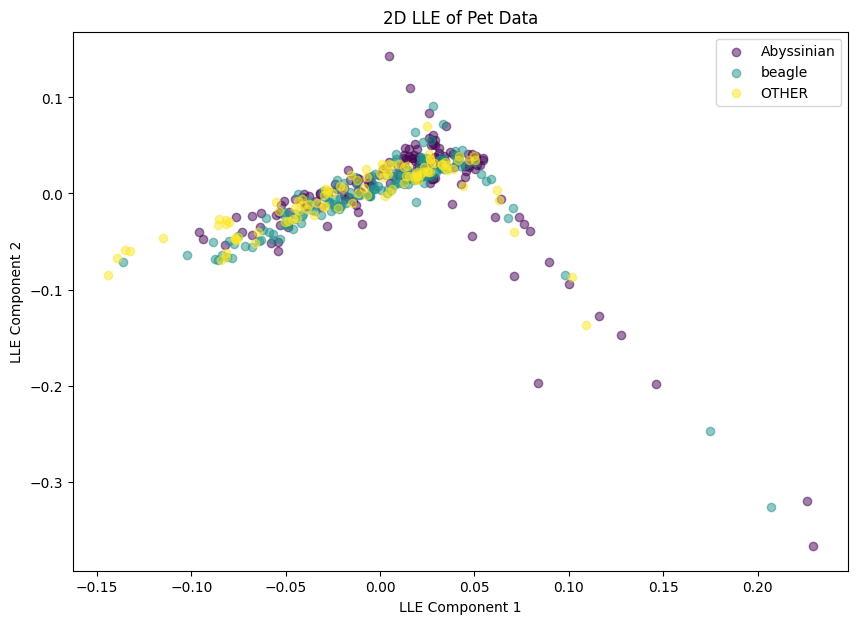

In [128]:
lle = LocallyLinearEmbedding(n_components=2, random_state=0)
lle_components = lle.fit_transform(scaled_data)

lle_df = pd.DataFrame(data=lle_components, columns=['LLE1', 'LLE2'])
lle_df[RECOGNIZE] = classification_df[RECOGNIZE].values

plt.figure(figsize=(10, 7))
for i, pet_type in enumerate(unique_pet_types):
    indices_to_keep = lle_df[RECOGNIZE] == pet_type
    plt.scatter(
        lle_df.loc[indices_to_keep, 'LLE1'],
        lle_df.loc[indices_to_keep, 'LLE2'],
        color=colors[i],
        alpha=0.5,
        label=pet_type
    )
plt.xlabel('LLE Component 1')
plt.ylabel('LLE Component 2')
plt.title('2D LLE of Pet Data')
plt.legend()
plt.show()

## III.3 Machine Learning and Deep Learning

### 2 supervised methods 

#### Decision Tree

In [129]:
X = classification_df_copy.select_dtypes(include=[float, int])
y = classification_df_copy[RECOGNIZE]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

classifier = DecisionTreeClassifier(max_depth=5, random_state=0)
classifier.fit(X_train, y_train)

y_pred = classifier.predict(X_test)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

  Abyssinian       0.56      0.66      0.61        41
       OTHER       0.33      0.28      0.30        36
      beagle       0.63      0.62      0.62        47

    accuracy                           0.53       124
   macro avg       0.51      0.52      0.51       124
weighted avg       0.52      0.53      0.52       124



#### Precision:
Abyssinian: 0.65, which suggests that when the model predicts a pet as a Abyssinian, 65% of those predictions are correct.

OTHER: 1, indicating a perfect score in this class.

beagle: 0.79, which is quite good.

#### Naive Bayes


In [130]:
from sklearn.naive_bayes import GaussianNB

In [131]:
gnbModel=GaussianNB()
gnbModel=gnbModel.fit(X_train, y_train)
y_pred = gnbModel.predict(X_test) 
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

  Abyssinian       0.58      0.37      0.45        41
       OTHER       0.42      0.56      0.48        36
      beagle       0.56      0.60      0.58        47

    accuracy                           0.51       124
   macro avg       0.52      0.51      0.50       124
weighted avg       0.52      0.51      0.51       124



The model performs reasonably well overall with an accuracy of 65%.
For class 0 and 2 the classification works good. Both have a precision of >60%
Class 1 has the poorest performance, likely due to the small number of instances (support = 10), leading to lower precision (0.13) and recall (0.20).

### 1 supervised ensemble learning method


##### Random Forest

In [132]:
X = classification_df_copy.select_dtypes(include=[float, int])

y = classification_df_copy[RECOGNIZE]
y_encoded = LabelEncoder().fit_transform(y)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_encoded, test_size=0.3, random_state=0)

forest = RandomForestClassifier(n_estimators=100, random_state=0)
forest.fit(X_train, y_train)

predictions = forest.predict(X_test)
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.59      0.78      0.67        41
           1       0.53      0.25      0.34        36
           2       0.62      0.70      0.66        47

    accuracy                           0.60       124
   macro avg       0.58      0.58      0.56       124
weighted avg       0.59      0.60      0.57       124



This Model works a lot better than the Decision Tree:
#### Precision:

Class 0:  0.62, which suggests that 62% of the predictions made as class 0 are correct.

Class 1: 1, indicating a strong accuracy in identifying this class.

Class 2:  0.82, which is quite good, meaning that the predictions for this class are generally reliable.

#### Recall (Sensitivity):

Class 0: 0.87, indicating that the model is able to identify 87% of all actual class 0 instances correctly.

Class 1:  0.10, suggesting that some instances of class 1 might be missed.

Class 2:  0.82, showing that the model identifies the majority of the actual class 2 instances.

#### F1-Score:

Class 0: 0.72, this class shows a good balance between precision and recall.

Class 1:  0.18, the lowest among the classes, suggesting that the balance between precision and recall could be better optimized.

Class 2:  0.62, which is fairly balanced but could be improved for optimal performance.

#### Overall Accuracy:

The model achieves an overall accuracy of 0.75, which indicates that it correctly predicts the class for 75% of the cases in the test set.


### 2 clustering methods 

##### K-Means Clustering

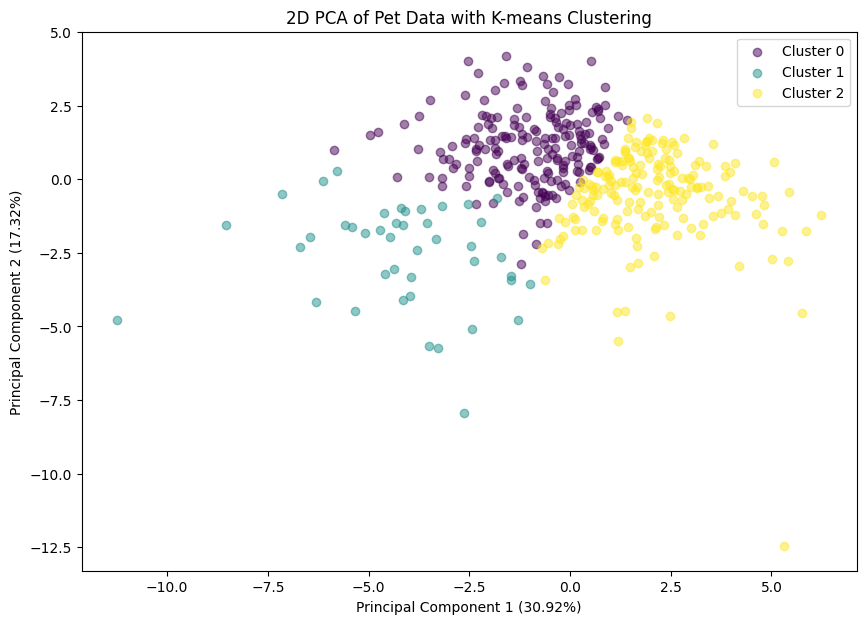

In [133]:
from sklearn.metrics.cluster import contingency_matrix
from sklearn.cluster import KMeans
# Apply K-means clustering
kmeans = KMeans(n_clusters=3, random_state=44, n_init=10)
clusters = kmeans.fit_predict(scaled_data)

# Add the cluster labels to the PCA DataFrame
pca_df['Cluster'] = clusters

# Visualize the 2D projection with legend
plt.figure(figsize=(10, 7))

# Use different colors for each cluster
colors = plt.cm.viridis(np.linspace(0, 1, len(np.unique(clusters))))

for i in range(len(np.unique(clusters))):
    indices_to_keep = pca_df['Cluster'] == i
    plt.scatter(
        pca_df.loc[indices_to_keep, 'PC1'],
        pca_df.loc[indices_to_keep, 'PC2'],
        color=colors[i],
        alpha=0.5,
        label=f'Cluster {i}'
    )

plt.xlabel(f'Principal Component 1 ({pc1}%)')
plt.ylabel(f'Principal Component 2 ({pc2}%)')
plt.title('2D PCA of Pet Data with K-means Clustering')
plt.legend()
plt.show()


In [134]:
from sklearn.metrics.cluster import contingency_matrix
from sklearn.metrics import silhouette_samples, silhouette_score
tab=contingency_matrix(pca_df[RECOGNIZE],pca_df['Cluster'])
print(tab)
silhouette_avg = silhouette_score(scaled_data, pca_df['Cluster'])
silhouette_avg

[[76 26 54]
 [49  5 51]
 [64 12 74]]


np.float64(0.17728499470980183)

##### Meanshift Cluster

Silhouette Score for Mean Shift Clustering:  0.049458042084760574


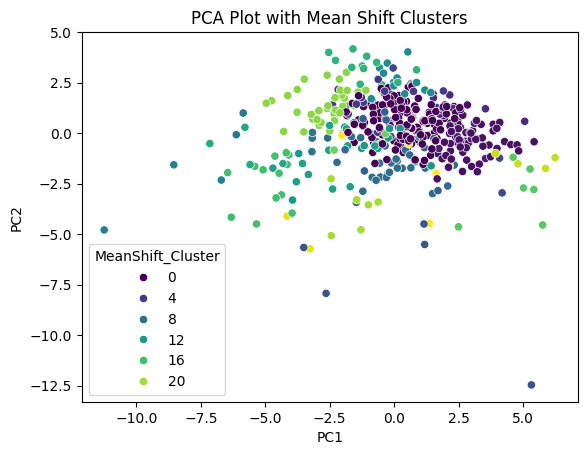

In [135]:
from sklearn.cluster import MeanShift
meanshift = MeanShift(bandwidth=2, bin_seeding=True)
meanshift.fit(scaled_data)
pca_df['MeanShift_Cluster'] = meanshift.labels_

# Evaluate the clustering
silhouette_avg = silhouette_score(scaled_data, pca_df['MeanShift_Cluster'])
print("Silhouette Score for Mean Shift Clustering: ", silhouette_avg)

# Visualize the clustering
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='MeanShift_Cluster', palette='viridis')
plt.title('PCA Plot with Mean Shift Clusters')
plt.show()


In [136]:
tab=contingency_matrix(pca_df[RECOGNIZE],pca_df['MeanShift_Cluster'])
print(tab)

[[56 11  2  0  4  0  4  5 20  4  2  4  7  4  2  1  7  4  0 13  5  0  1  0]
 [39 19  0  0  2  3  1  4  1  0  0  2  3  5  0  3  2  1  1 14  1  4  0  0]
 [46 21  7 10  7  0  0  2  6  1  1  9  3  4  2  9  4  1  2  9  0  0  1  5]]


Silhouette Score for Reduced Clustering:  0.22721546360862832
[[ 10 118  28]
 [  2  87  16]
 [  1 132  17]]


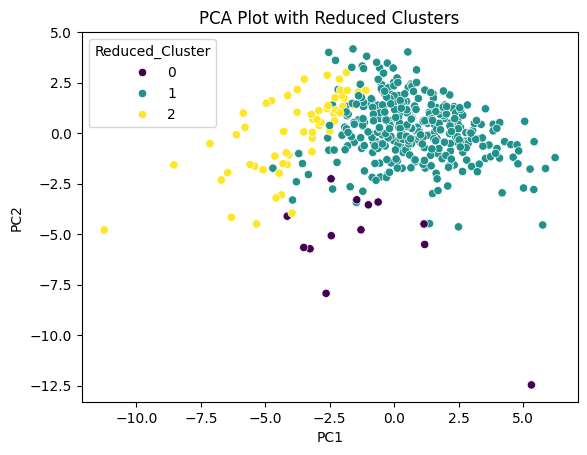

In [137]:
# Get the cluster centers from Mean Shift
cluster_centers = meanshift.cluster_centers_

# Apply KMeans to the cluster centers to reduce the number of clusters
kmeans = KMeans(n_clusters=3, random_state=44)
kmeans.fit(cluster_centers)

# Map the original Mean Shift clusters to the new KMeans clusters
cluster_mapping = kmeans.predict(cluster_centers)
pca_df['Reduced_Cluster'] = pca_df['MeanShift_Cluster'].map(dict(enumerate(cluster_mapping)))

silhouette_avg = silhouette_score(scaled_data, pca_df['Reduced_Cluster'])
print("Silhouette Score for Reduced Clustering: ", silhouette_avg)
tab=contingency_matrix(pca_df[RECOGNIZE],pca_df['Reduced_Cluster'])
print(tab)

# PCA Plot with Reduced Clusters
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Reduced_Cluster', palette='viridis')
plt.title('PCA Plot with Reduced Clusters')
plt.show()



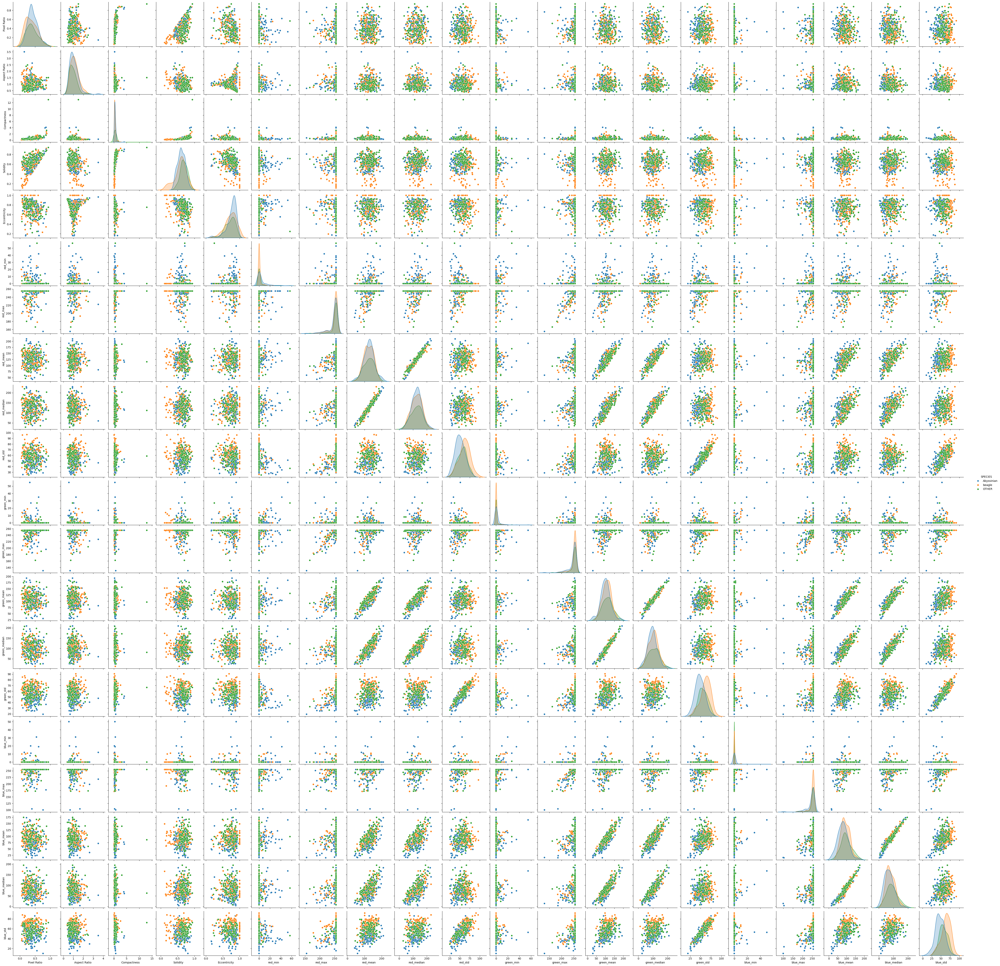

In [138]:
sns.pairplot(classification_df,hue=RECOGNIZE)

#### Test the data

In [139]:
def calculate_add_df_test(df):
    image_folder = r"pets/test"
    mask_folder = r"pets/test/masks"
    df.index = [i for i in range(1, 119)]
    
    pixel_ratios = []
    aspect_ratios = []
    compactness_scores = []
    solidities = []
    eccentricities = []
    color_stats = []

    for idx in df.index:
        image_path = os.path.join(image_folder, f"{idx}.JPG")
        mask_path = os.path.join(mask_folder, f"{idx}.tif")

        if os.path.exists(image_path) and os.path.exists(mask_path):
            image = Image.open(image_path).convert('RGB')
            mask = Image.open(mask_path).convert('L')

            # Call the updated function names
            pixel_ratios.append(pixel_ratio(mask))
            aspect_ratios.append(aspect_ratio(mask))
            compactness_scores.append(compactness(mask))
            solidities.append(solidity(mask))
            color_stats.append(color_statistics(image, mask))
            eccentricities.append(eccentricity(mask))
        else:
            pixel_ratios.append(np.nan)
            aspect_ratios.append(np.nan)
            compactness_scores.append(np.nan)
            solidities.append(np.nan)
            eccentricities.append(np.nan)
            color_stats.append({key: np.nan for key in ['red_min', 'red_max', 'red_mean', 'red_median', 'red_std',
                                                       'green_min', 'green_max', 'green_mean', 'green_median', 'green_std',
                                                       'blue_min', 'blue_max', 'blue_mean', 'blue_median', 'blue_std']})

    df['Pixel Ratio'] = pixel_ratios
    df['Aspect Ratio'] = aspect_ratios
    df['Compactness'] = compactness_scores
    df['Solidity'] = solidities
    df['Eccentricity'] = eccentricities
    
    for key in color_stats[0]:
        df[key] = [cs[key] for cs in color_stats]

    return df

ids = list(range(1, 119))
test_df = pd.DataFrame(ids, columns=['ID'])
test_df = calculate_add_df_test(test_df)
test_df

,ID,Pixel Ratio,Aspect Ratio,Compactness,Solidity,Eccentricity,red_min,red_max,red_mean,red_median,...,green_min,green_max,green_mean,green_median,green_std,blue_min,blue_max,blue_mean,blue_median,blue_std
1,1,0.171808,1.329710,0.229071,0.404509,0.803816,0.0,245.0,118.695179,118.0,...,0.0,239.0,95.271208,89.0,43.028008,0.0,244.0,69.557574,58.0,44.854412
2,2,0.272135,1.002137,0.208017,0.350370,0.844065,3.0,255.0,127.235783,131.0,...,0.0,237.0,102.044606,102.0,49.408484,0.0,231.0,85.214768,81.0,41.821843
3,3,0.194557,0.346912,0.212718,0.502362,0.931196,0.0,255.0,95.634786,87.0,...,0.0,255.0,71.243104,64.0,43.177620,0.0,255.0,59.074555,53.0,39.814337
4,4,0.432167,0.771635,0.642366,0.539107,0.840624,0.0,155.0,28.972703,23.0,...,0.0,153.0,22.627314,18.0,18.776390,0.0,153.0,15.204675,12.0,13.930335
5,5,0.866467,1.268456,4.447791,0.912070,0.648678,8.0,255.0,114.688890,116.0,...,4.0,255.0,85.582327,82.0,49.562071,4.0,255.0,69.601947,61.0,43.820518
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,114,0.541752,1.320106,0.724950,0.541752,0.941684,1.0,255.0,60.172313,46.0,...,0.0,255.0,53.797715,41.0,43.276735,0.0,255.0,37.621652,26.0,39.567364
115,115,0.687038,1.104592,1.381891,0.791519,0.386838,0.0,255.0,101.657785,92.0,...,0.0,251.0,79.311860,67.0,57.668044,0.0,254.0,69.674770,55.0,57.947513
116,116,0.185909,1.135021,0.364663,0.542453,0.778024,3.0,253.0,153.929026,155.0,...,8.0,254.0,149.602961,150.0,52.729987,0.0,255.0,154.596936,157.0,53.686057
117,117,0.376148,0.803653,0.355023,0.652029,0.622653,0.0,255.0,88.052028,78.0,...,0.0,255.0,85.306892,82.0,58.093226,0.0,255.0,81.110240,75.0,55.339396


In [140]:
test_df.isna().sum()
test_df_copy = test_df.copy()
test_df_copy = test_df_copy.drop(columns=['ID'])
test_df_copy

,Pixel Ratio,Aspect Ratio,Compactness,Solidity,Eccentricity,red_min,red_max,red_mean,red_median,red_std,green_min,green_max,green_mean,green_median,green_std,blue_min,blue_max,blue_mean,blue_median,blue_std
1,0.171808,1.329710,0.229071,0.404509,0.803816,0.0,245.0,118.695179,118.0,45.742256,0.0,239.0,95.271208,89.0,43.028008,0.0,244.0,69.557574,58.0,44.854412
2,0.272135,1.002137,0.208017,0.350370,0.844065,3.0,255.0,127.235783,131.0,59.589017,0.0,237.0,102.044606,102.0,49.408484,0.0,231.0,85.214768,81.0,41.821843
3,0.194557,0.346912,0.212718,0.502362,0.931196,0.0,255.0,95.634786,87.0,52.295478,0.0,255.0,71.243104,64.0,43.177620,0.0,255.0,59.074555,53.0,39.814337
4,0.432167,0.771635,0.642366,0.539107,0.840624,0.0,155.0,28.972703,23.0,22.371768,0.0,153.0,22.627314,18.0,18.776390,0.0,153.0,15.204675,12.0,13.930335
5,0.866467,1.268456,4.447791,0.912070,0.648678,8.0,255.0,114.688890,116.0,51.436605,4.0,255.0,85.582327,82.0,49.562071,4.0,255.0,69.601947,61.0,43.820518
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,0.541752,1.320106,0.724950,0.541752,0.941684,1.0,255.0,60.172313,46.0,46.582378,0.0,255.0,53.797715,41.0,43.276735,0.0,255.0,37.621652,26.0,39.567364
115,0.687038,1.104592,1.381891,0.791519,0.386838,0.0,255.0,101.657785,92.0,52.466605,0.0,251.0,79.311860,67.0,57.668044,0.0,254.0,69.674770,55.0,57.947513
116,0.185909,1.135021,0.364663,0.542453,0.778024,3.0,253.0,153.929026,155.0,52.610167,8.0,254.0,149.602961,150.0,52.729987,0.0,255.0,154.596936,157.0,53.686057
117,0.376148,0.803653,0.355023,0.652029,0.622653,0.0,255.0,88.052028,78.0,63.487571,0.0,255.0,85.306892,82.0,58.093226,0.0,255.0,81.110240,75.0,55.339396


In [141]:

X = classification_df_copy.select_dtypes(include=[np.number])  # Ensure this selects only numeric columns
y = classification_df_copy[RECOGNIZE]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  # Fit and transform the scaler on the training data

# Assuming test_df_copy is your testing DataFrame and has the same structure
test_scaled = scaler.transform(test_df_copy.select_dtypes(include=[np.number]))  # Only transform the test data

forest = RandomForestClassifier(n_estimators=100, random_state=0)
forest.fit(X_scaled, y)  # Fit model on scaled training data

predictions = forest.predict(test_scaled)  # Predict using the scaled test data
print(predictions)


['Abyssinian' 'Abyssinian' 'Abyssinian' 'Abyssinian' 'Abyssinian'
 'Abyssinian' 'Abyssinian' 'Abyssinian' 'Abyssinian' 'Abyssinian'
 'Abyssinian' 'beagle' 'Abyssinian' 'Abyssinian' 'Abyssinian' 'Abyssinian'
 'Abyssinian' 'Abyssinian' 'beagle' 'beagle' 'Abyssinian' 'Abyssinian'
 'Abyssinian' 'Abyssinian' 'Abyssinian' 'beagle' 'Abyssinian' 'Abyssinian'
 'Abyssinian' 'Abyssinian' 'Abyssinian' 'Abyssinian' 'beagle' 'Abyssinian'
 'Abyssinian' 'Abyssinian' 'OTHER' 'Abyssinian' 'Abyssinian' 'Abyssinian'
 'Abyssinian' 'Abyssinian' 'OTHER' 'Abyssinian' 'Abyssinian' 'beagle'
 'Abyssinian' 'OTHER' 'Abyssinian' 'Abyssinian' 'Abyssinian' 'OTHER'
 'Abyssinian' 'beagle' 'beagle' 'OTHER' 'beagle' 'beagle' 'beagle'
 'beagle' 'beagle' 'beagle' 'beagle' 'beagle' 'OTHER' 'OTHER' 'beagle'
 'beagle' 'beagle' 'beagle' 'beagle' 'Abyssinian' 'OTHER' 'Abyssinian'
 'beagle' 'beagle' 'OTHER' 'beagle' 'Abyssinian' 'beagle' 'beagle'
 'beagle' 'beagle' 'beagle' 'beagle' 'beagle' 'OTHER' 'beagle' 'beagle'
 'Abyssinia

In [142]:
results = pd.DataFrame(ids, columns=['ID'])
results['Results']=predictions
results

,ID,Results
0,1,Abyssinian
1,2,Abyssinian
2,3,Abyssinian
3,4,Abyssinian
4,5,Abyssinian
...,...,...
113,114,Abyssinian
114,115,beagle
115,116,OTHER
116,117,OTHER


In [143]:
results.to_csv('Prediction_Results.csv', index=False)